# Smart Queue Monitoring System - Transportation Scenario

## Overview
Now that you have your Python script and job submission script, you're ready to request an **IEI Tank-870** edge node and run inference on the different hardware types (CPU, GPU, VPU, FPGA).

After the inference is completed, the output video and stats files need to be retrieved and stored in the workspace, which can then be viewed within the Jupyter Notebook.

## Objectives
* Submit inference jobs to Intel's DevCloud using the `qsub` command.
* Retrieve and review the results.
* After testing, go back to the proposal doc and update your original proposed hardware device.

## Step 0: Set Up

#### IMPORTANT: Set up paths so we can run Dev Cloud utilities
You *must* run this every time you enter a Workspace session.
(Tip: select the cell and use **Shift+Enter** to run the cell.)

In [1]:
%env PATH=/opt/conda/bin:/opt/spark-2.4.3-bin-hadoop2.7/bin:/opt/conda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/opt/intel_devcloud_support
import os
import sys
sys.path.insert(0, os.path.abspath('/opt/intel_devcloud_support'))
sys.path.insert(0, os.path.abspath('/opt/intel'))

env: PATH=/opt/conda/bin:/opt/spark-2.4.3-bin-hadoop2.7/bin:/opt/conda/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/opt/intel_devcloud_support


### Step 0.1:  (Optional-step): Original Video

If you are curious to see the input video, run the following cell to view the original video stream we'll be using for inference.

In [2]:
import videoHtml
videoHtml.videoHTML('Transportation', ['original_videos/Transportation.mp4'])

## Step 1 : Inference on a Video

In the next few cells, You'll submit your job using the `qsub` command and retrieving the results for each job. Each of the cells below should submit a job to different edge compute nodes.

The output of the cell is the `JobID` of your job, which you can use to track progress of a job with `liveQStat`.

You will need to submit a job for each of the following hardware types:
* **CPU**
* **GPU**
* **VPU**
* **FPGA**

**Note:** You will have to submit each job one at a time and retrieve their results. 

After submission, they will go into a queue and run as soon as the requested compute resources become available. 
(Tip: **shift+enter** will run the cell and automatically move you to the next cell.)

If your job successfully runs and completes, once you retrieve your results, it should output a video and a stats text file in the `results/transportation/<DEVICE>` directory.

For example, your **CPU** job should output its files in this directory:
> **results/transportation/cpu**

**Note**: To get the queue labels for the different hardware devices, you can go to [this link](https://devcloud.intel.com/edge/get_started/devcloud/).

The following arguments should be passed to the job submission script after the `-F` flag:
* Model path - `/data/models/intel/person-detection-retail-0013/<MODEL PRECISION>/`. You will need to adjust this path based on the model precision being using on the hardware.
* Device - `CPU`, `GPU`, `MYRIAD`, `HETERO:FPGA,CPU`
* Manufacturing video path - `/data/resources/transportation.mp4`
* Manufacturing queue_param file path - `/data/queue_param/transportation.npy`
* Output path - `/output/results/transportation/<DEVICE>` This should be adjusted based on the device used in the job.
* Max num of people - This is the max number of people in queue before the system would redirect them to another queue.

## Step 1.1: Submit to an Edge Compute Node with an Intel® CPU
In the cell below, write a script to submit a job to an <a 
    href="https://software.intel.com/en-us/iot/hardware/iei-tank-dev-kit-core">IEI 
    Tank* 870-Q170</a> edge node with an <a 
    href="https://ark.intel.com/products/88186/Intel-Core-i5-6500TE-Processor-6M-Cache-up-to-3-30-GHz-">Intel® Core™ i5-6500TE processor</a>. The inference workload should run on the CPU.

In [34]:
#Submit job to the queue
cpu_job_id = !qsub queue_job.sh -d . -l nodes=1:tank-870:i5-6500te -F "/data/models/intel/person-detection-retail-0013/FP32/person-detection-retail-0013 CPU /data/resources/transportation.mp4 /data/queue_param/transportation.npy /output/results/transportation/CPU 15"


print(cpu_job_id[0])

XzQP0pu71k4KWVGx0fqFFw9OpSJHYjua


#### Check Job Status

To check on the job that was submitted, use `liveQStat` to check the status of the job.

Column `S` shows the state of your running jobs.

For example:
- If `JOB ID`is in Q state, it is in the queue waiting for available resources.
- If `JOB ID` is in R state, it is running.

In [4]:
import liveQStat
liveQStat.liveQStat()

#### Get Results

Run the next cell to retrieve your job's results.

In [35]:
import get_results
get_results.getResults(cpu_job_id[0], filename='output.tgz', blocking=True)

getResults() is blocking until results of the job (id:XzQP0pu71k4KWVGx0fqFFw9OpSJHYjua) are ready.
Please wait...........................................Success!
output.tgz was downloaded in the same folder as this notebook.


#### Unpack your output files and view stdout.log

In [36]:
!tar zxf output.tgz

In [37]:
!cat stdout.log

counter : 1
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 167, xmax 420, ymin 169, ymax 1014 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 792, xmax 1078, ymin 91, ymax 964 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 568, xmax 874, ymin 137, ymax 993 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1486, xmax 1745, ymin 146, ymax 1029 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 382, xmax 668, ymin 109, ymax 976 
assigned values
drawn rectangle
drawn output
inside p

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


xmin 409, xmax 671, ymin 149, ymax 922 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1590, xmax 1814, ymin 114, ymax 969 
assigned values
drawn rectangle
drawn output
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict f

inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 572, xmax 857, ymin 140, ymax 1001 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 764, xmax 1023, ymin 99, ymax 975 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1450, xmax 1747, ymin 123, ymax 1022 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 430, xmax 660, ymin 113, ymax 935 
assigned values
drawn rectangle
drawn output
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside p

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
got coords, image
got num_people
Total People in frame = 8
Number of people in queue = {1: 3, 2: 0}
inside #1 for
got out text: No. of People in Queue 1 is 3 
putted text
inside #1 for
got out text: No. of People in Queue 2 is 0 
putted text
written image
counter : 112
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 57

drawn rectangle
drawn output
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside pred

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 398, xmax 596, ymin 126, ymax 862 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 171, xmax 368, ymin 333, ymax 826 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1161, xmax 1372, ymin 118, ymax 824 
assigned values
drawn rectangle
drawn output
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
in

drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1566, xmax 1780, ymin 114, ymax 990 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1154, xmax 1403, ymin 113, ymax 832 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 167, xmax 376, ymin 339, ymax 851 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 642, xmax 843, ymin 98, ymax 939 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1660, xmax 1866, ymin 128, ymax 987 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 

got coordinates
append coordinates
inside draw output
xmin 671, xmax 858, ymin 109, ymax 875 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 111, xmax 262, ymin 142, ymax 695 
assigned values
drawn rectangle
drawn output
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
insi

request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 328, xmax 583, ymin 130, ymax 962 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1602, xmax 1856, ymin 142, ymax 988 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1032, xmax 1291, ymin 110, ymax 950 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1334, xmax 1631, ymin 136, ymax 982 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 724, xmax 929, ymin 97, ymax 929 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
ins

inside draw output
xmin 1142, xmax 1369, ymin 135, ymax 907 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 787, xmax 999, ymin 81, ymax 925 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1412, xmax 1611, ymin 110, ymax 874 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 154, xmax 334, ymin 207, ymax 743 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1084, xmax 1237, ymin 113, ymax 755 
assigned values
drawn rectangle
drawn output
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
ins

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 



#### View stderr.log
This can be used for debugging

In [38]:
!cat stderr.log

person_detect.py:48: DeprecationWarning: Reading network using constructor is deprecated. Please, use IECore.read_network() method instead
  self.model=IENetwork(self.model_structure, self.model_weights)


#### View Output Video
Run the cell below to view the output video. If inference was successfully run, you should see a video with bounding boxes drawn around each person detected.

In [39]:
import videoHtml

videoHtml.videoHTML('Transportation CPU', ['results/transportation/CPU/output_video.mp4'])

## Step 1.2: Submit to an Edge Compute Node with CPU and IGPU
In the cell below, write a script to submit a job to an <a 
    href="https://software.intel.com/en-us/iot/hardware/iei-tank-dev-kit-core">IEI 
    Tank* 870-Q170</a> edge node with an <a href="https://ark.intel.com/products/88186/Intel-Core-i5-6500TE-Processor-6M-Cache-up-to-3-30-GHz-">Intel® Core i5-6500TE</a>. The inference workload should run on the **Intel® HD Graphics 530** integrated GPU.

In [40]:
#Submit job to the queue
gpu_job_id = !qsub queue_job.sh -d . -l nodes=1:tank-870:i5-6500te -F "/data/models/intel/person-detection-retail-0013/FP32/person-detection-retail-0013 GPU /data/resources/transportation.mp4 /data/queue_param/transportation.npy /output/results/transportation/GPU 15"


print(gpu_job_id[0])

LA7iFWSj9wAUXdfEsi2XQx82U0WMXYiI


### Check Job Status

To check on the job that was submitted, use `liveQStat` to check the status of the job.

Column `S` shows the state of your running jobs.

For example:
- If `JOB ID`is in Q state, it is in the queue waiting for available resources.
- If `JOB ID` is in R state, it is running.

In [41]:
import liveQStat
liveQStat.liveQStat()

#### Get Results

Run the next cell to retrieve your job's results.

In [42]:
import get_results
get_results.getResults(gpu_job_id[0], filename='output.tgz', blocking=True)

getResults() is blocking until results of the job (id:LA7iFWSj9wAUXdfEsi2XQx82U0WMXYiI) are ready.
Please wait..........................................................................Success!
output.tgz was downloaded in the same folder as this notebook.


#### Unpack your output files and view stdout.log

In [43]:
!tar zxf output.tgz

In [44]:
!cat stdout.log

counter : 1
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 167, xmax 420, ymin 169, ymax 1014 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 792, xmax 1078, ymin 91, ymax 964 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 568, xmax 874, ymin 137, ymax 993 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1486, xmax 1745, ymin 146, ymax 1029 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 382, xmax 668, ymin 109, ymax 976 
assigned values
drawn rectangle
drawn output
inside p

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside draw output
xmin 1212, xmax 1450, ymin 157, ymax 1056 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 399, xmax 653, ymin 116, ymax 964 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 568, xmax 869, ymin 169, ymax 1001 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 806, xmax 1034, ymin 98, ymax 987 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1441, xmax 1705, ymin 148, ymax 1011 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1618, xmax 1844, ymin 108, ymax 1003 
assigned values
drawn rectangle
drawn output
i

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


xmin 121, xmax 268, ymin 146, ymax 683 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1170, xmax 1348, ymin 122, ymax 736 
assigned values
drawn rectangle
drawn output
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict f

drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 908, xmax 1181, ymin 106, ymax 955 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1557, xmax 1797, ymin 143, ymax 981 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1248, xmax 1421, ymin 129, ymax 731 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1748, xmax 1919, ymin 184, ymax 958 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 169, xmax 374, ymin 335, ymax 846 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmi

inside draw output
xmin 351, xmax 644, ymin 122, ymax 966 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1555, xmax 1802, ymin 128, ymax 968 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 980, xmax 1234, ymin 125, ymax 927 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1329, xmax 1635, ymin 150, ymax 985 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 587, xmax 817, ymin 115, ymax 955 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1262, xmax 1493, ymin 114, ymax 830 
assigned values
drawn rectangle
drawn output
insi

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


append coordinates
inside draw output
xmin 849, xmax 1103, ymin 93, ymax 929 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 683, xmax 919, ymin 118, ymax 931 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 317, xmax 579, ymin 126, ymax 961 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1153, xmax 1451, ymin 128, ymax 1032 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1338, xmax 1542, ymin 71, ymax 837 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1474, xmax 1636, ymin 97, ymax 753 
assigned values
drawn rectangle


written image
counter : 324
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 760, xmax 1018, ymin 120, ymax 947 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1521, xmax 1800, ymin 136, ymax 953 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 400, xmax 647, ymin 109, ymax 945 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1133, xmax 1434, ymin 116, ymax 962 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1340, xmax 1574, ymin 63, ymax 910 
assigned values
drawn rectangle
dra

#### View stderr.log
This can be used for debugging

In [45]:
!cat stderr.log

person_detect.py:48: DeprecationWarning: Reading network using constructor is deprecated. Please, use IECore.read_network() method instead
  self.model=IENetwork(self.model_structure, self.model_weights)


#### View Output Video
Run the cell below to view the output video. If inference was successfully run, you should see a video with bounding boxes drawn around each person detected.

In [46]:
import videoHtml

videoHtml.videoHTML('Transportation GPU', ['results/transportation/GPU/output_video.mp4'])

## Step 1.3: Submit to an Edge Compute Node with an Intel® Neural Compute Stick 2
In the cell below, write a script to submit a job to an <a 
    href="https://software.intel.com/en-us/iot/hardware/iei-tank-dev-kit-core">IEI 
    Tank 870-Q170</a> edge node with an <a href="https://ark.intel.com/products/88186/Intel-Core-i5-6500TE-Processor-6M-Cache-up-to-3-30-GHz-">Intel Core i5-6500te CPU</a>. The inference workload should run on an <a 
    href="https://software.intel.com/en-us/neural-compute-stick">Intel Neural Compute Stick 2</a> installed in this  node.

In [47]:
#Submit job to the queue
vpu_job_id = !qsub queue_job.sh -d . -l nodes=1:tank-870:i5-6500te:intel-ncs2 -F "/data/models/intel/person-detection-retail-0013/FP16/person-detection-retail-0013 MYRIAD /data/resources/transportation.mp4 /data/queue_param/transportation.npy /output/results/transportation/VPU 15"


print(vpu_job_id[0])

LYhkL9oeuhvkg1JxBZ1Grwxo2BTLEheN


### Check Job Status

To check on the job that was submitted, use `liveQStat` to check the status of the job.

Column `S` shows the state of your running jobs.

For example:
- If `JOB ID`is in Q state, it is in the queue waiting for available resources.
- If `JOB ID` is in R state, it is running.

In [ ]:
import liveQStat
liveQStat.liveQStat()

#### Get Results

Run the next cell to retrieve your job's results.

In [48]:
import get_results
get_results.getResults(vpu_job_id[0], filename='output.tgz', blocking=True)

getResults() is blocking until results of the job (id:LYhkL9oeuhvkg1JxBZ1Grwxo2BTLEheN) are ready.
Please wait....................................................................Success!
output.tgz was downloaded in the same folder as this notebook.


#### Unpack your output files and view stdout.log

In [49]:
!tar zxf output.tgz

In [50]:
!cat stdout.log

counter : 1
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 167, xmax 420, ymin 169, ymax 1015 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 792, xmax 1077, ymin 90, ymax 963 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 568, xmax 874, ymin 137, ymax 993 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1485, xmax 1746, ymin 146, ymax 1029 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 383, xmax 669, ymin 108, ymax 976 
assigned values
drawn rectangle
drawn output
inside p

inside predict for 
inside predict for 
got coords, image
got num_people
Total People in frame = 8
Number of people in queue = {1: 2, 2: 0}
inside #1 for
got out text: No. of People in Queue 1 is 2 
putted text
inside #1 for
got out text: No. of People in Queue 2 is 0 
putted text
written image
counter : 26
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 139, xmax 397, ymin 167, ymax 1029 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1219, xmax 1461, ymin 151, ymax 1064 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 571, xmax 828, ymin 155, ymax 1013 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coo

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


putted text
inside #1 for
got out text: No. of People in Queue 2 is 0 
putted text
written image
counter : 68
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 227, xmax 478, ymin 162, ymax 981 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 571, xmax 859, ymin 140, ymax 1002 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1218, xmax 1455, ymin 143, ymax 1057 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 763, xmax 1005, ymin 95, ymax 970 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw ou

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


counter : 117
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 574, xmax 856, ymin 305, ymax 1011 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 255, xmax 503, ymin 153, ymax 995 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1413, xmax 1710, ymin 175, ymax 1009 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1621, xmax 1873, ymin 79, ymax 995 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 754, xmax 1016, ymin 129, ymax 956 
assigned values
drawn rectangle
drawn output
insi

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1672, xmax 1869, ymin 110, ymax 975 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 117, xmax 273, ymin 133, ymax 684 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1265, xmax 1421, ymin 117, ymax 768 
assigned values
drawn rectangle
drawn output
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
insid

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside draw output
xmin 169, xmax 375, ymin 333, ymax 840 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 629, xmax 816, ymin 108, ymax 910 
assigned values
drawn rectangle
drawn output
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 335, xmax 589, ymin 132, ymax 966 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 633, xmax 866, ymin 114, ymax 956 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1590, xmax 1825, ymin 132, ymax 966 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1242, xmax 1514, ymin 136, ymax 987 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 792, xmax 1000, ymin 91, ymax 916 
assigned values
drawn rectangle
drawn output
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
got coords, image
got num_people
Total People in frame = 8
Number of people in queue = {1: 3, 2: 2}
inside #1 for
got out text: No. of People in Queue 1 is 3 
putted text
inside #1 for
got out text: No. of People in Queue 2 is 2 
putted text
written image
counter : 323
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 759, xmax 1014, ymin 116, ymax 953 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1522, xmax 1800, ymin 134, ymax 951 
assigned values
drawn rectangle
drawn output
in

#### View stderr.log
This can be used for debugging

In [51]:
!cat stderr.log

person_detect.py:48: DeprecationWarning: Reading network using constructor is deprecated. Please, use IECore.read_network() method instead
  self.model=IENetwork(self.model_structure, self.model_weights)


#### View Output Video
Run the cell below to view the output video. If inference was successfully run, you should see a video with bounding boxes drawn around each person detected.

In [52]:
import videoHtml

videoHtml.videoHTML('Transportation VPU', ['results/transportation/VPU/output_video.mp4'])

## Step 1.4: Submit to an Edge Compute Node with IEI Mustang-F100-A10
In the cell below, write a script to submit a job to an <a 
    href="https://software.intel.com/en-us/iot/hardware/iei-tank-dev-kit-core">IEI 
    Tank 870-Q170</a> edge node with an <a href="https://ark.intel.com/products/88186/Intel-Core-i5-6500TE-Processor-6M-Cache-up-to-3-30-GHz-">Intel Core™ i5-6500te CPU</a> . The inference workload will run on the <a href="https://www.ieiworld.com/mustang-f100/en/"> IEI Mustang-F100-A10 </a> FPGA card installed in this node.

In [53]:
#Submit job to the queue
fpga_job_id = !qsub queue_job.sh -d . -l nodes=1:tank-870:i5-6500te:iei-mustang-f100-a10 -F "/data/models/intel/person-detection-retail-0013/FP16/person-detection-retail-0013 HETERO:FPGA,CPU /data/resources/transportation.mp4 /data/queue_param/transportation.npy /output/results/transportation/FPGA 15"


print(fpga_job_id[0])

dtGRIgxV5ZK8RQEYTF8yS6b4P6eqTufj


### Check Job Status

To check on the job that was submitted, use `liveQStat` to check the status of the job.

Column `S` shows the state of your running jobs.

For example:
- If `JOB ID`is in Q state, it is in the queue waiting for available resources.
- If `JOB ID` is in R state, it is running.

In [ ]:
import liveQStat
liveQStat.liveQStat()

#### Get Results

Run the next cell to retrieve your job's results.

In [54]:
import get_results
get_results.getResults(fpga_job_id[0], filename='output.tgz', blocking=True)

getResults() is blocking until results of the job (id:dtGRIgxV5ZK8RQEYTF8yS6b4P6eqTufj) are ready.
Please wait.......................................................................Success!
output.tgz was downloaded in the same folder as this notebook.


#### Unpack your output files and view stdout.log

In [55]:
!tar zxf output.tgz

In [56]:
!cat stdout.log

INTELFPGAOCLSDKROOT is not set
Using script's current directory (/opt/altera/aocl-pro-rte/aclrte-linux64)

aoc was not found, but aocl was found. Assuming only RTE is installed.

AOCL_BOARD_PACKAGE_ROOT is set to /opt/intel/openvino/bitstreams/a10_vision_design_sg2_bitstreams/BSP/a10_1150_sg2. Using that.
Adding /opt/altera/aocl-pro-rte/aclrte-linux64/bin to PATH
Adding /opt/altera/aocl-pro-rte/aclrte-linux64/linux64/lib to LD_LIBRARY_PATH
Adding /opt/altera/aocl-pro-rte/aclrte-linux64/host/linux64/lib to LD_LIBRARY_PATH
Adding /opt/intel/openvino/bitstreams/a10_vision_design_sg2_bitstreams/BSP/a10_1150_sg2/linux64/lib to LD_LIBRARY_PATH
aocl program: Running program from /opt/intel/openvino/bitstreams/a10_vision_design_sg2_bitstreams/BSP/a10_1150_sg2/linux64/libexec
Programming device: a10gx_2ddr : Intel Vision Accelerator Design with Intel Arria 10 FPGA (acla10_1150_sg20)
Program succeed. 
counter : 1
inside predict
got processed image
started async request
request completed #121
got

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
got coords, image
got num_people
Total People in frame = 6
Number of people in queue = {1: 2, 2: 0}
inside #1 for
got out text: No. of People in Queue 1 is 2 
putted text
inside #1 for
got out text: No. of People in Queue 2 is 0 
putted text
written image
counter : 67
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 231, xmax 482, ymin 165, ymax 981 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got c

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
got coords, image
got num_people
Total People in frame = 7
Number of people in queue = {1: 2, 2: 0}
inside #1 for
got out text: No. of People in Queue 1 is 2 
putted text
inside #1 for
got out text: No. of People in Queue 2 is 0 
putted text
written image
counter : 91
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 197, xmax 443, ymin 149, ymax 994 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1214, xmax 1448, ymin 158, ymax 1052 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append co

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
got coords, image
got num_people
Total People in frame = 9
Number of people in q

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


assigned values
drawn rectangle
drawn output
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict 

inside draw output
xmin 619, xmax 867, ymin 120, ymax 946 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1606, xmax 1841, ymin 133, ymax 977 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1248, xmax 1520, ymin 135, ymax 961 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1142, xmax 1370, ymin 135, ymax 907 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 786, xmax 999, ymin 81, ymax 924 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1412, xmax 1611, ymin 110, ymax 875 
assigned values
drawn rectangle
drawn output
insi

inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 


inside predict for 
inside predict for 
inside predict for 
inside predict for 
inside predict for 
got coords, image
got num_people
Total People in frame = 7
Number of people in queue = {1: 2, 2: 2}
inside #1 for
got out text: No. of People in Queue 1 is 2 
putted text
inside #1 for
got out text: No. of People in Queue 2 is 2 
putted text
written image
counter : 318
inside predict
got processed image
started async request
request completed #121
got result
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 1518, xmax 1798, ymin 130, ymax 954 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 732, xmax 977, ymin 120, ymax 955 
assigned values
drawn rectangle
drawn output
inside predict for 
indide predict if
got coordinates
append coordinates
inside draw output
xmin 375, xmax 624, ymin 115, ymax 956 
assigned values
drawn rectangle
drawn output
inside

#### View stderr.log
This can be used for debugging

In [57]:
!cat stderr.log

person_detect.py:48: DeprecationWarning: Reading network using constructor is deprecated. Please, use IECore.read_network() method instead
  self.model=IENetwork(self.model_structure, self.model_weights)


#### View Output Video
Run the cell below to view the output video. If inference was successfully run, you should see a video with bounding boxes drawn around each person detected.

In [58]:
import videoHtml

videoHtml.videoHTML('Transportation FPGA', ['results/transportation/FPGA/output_video.mp4'])

***Wait!***

Please wait for all the inference jobs and video rendering to complete before proceeding to the next step.

## Step 2: Assess Performance

Run the cells below to compare the performance across all 4 devices. The following timings for the model are being comapred across all 4 devices:

- Model Loading Time
- Average Inference Time
- FPS

In [59]:
import matplotlib.pyplot as plt

device_list=['CPU', 'GPU', 'FPGA', 'VPU']
inference_time=[]
fps=[]
model_load_time=[]

for device in device_list:
    with open('results/transportation/'+device+'/stats.txt', 'r') as f:
        inference_time.append(float(f.readline().split("\n")[0]))
        fps.append(float(f.readline().split("\n")[0]))
        model_load_time.append(float(f.readline().split("\n")[0]))

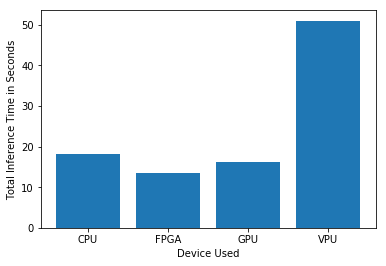

In [60]:
plt.bar(device_list, inference_time)
plt.xlabel("Device Used")
plt.ylabel("Total Inference Time in Seconds")
plt.show()

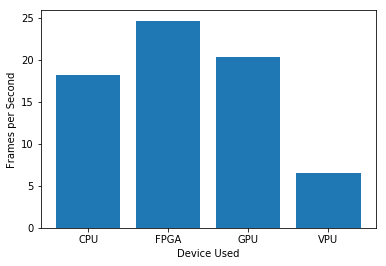

In [61]:
plt.bar(device_list, fps)
plt.xlabel("Device Used")
plt.ylabel("Frames per Second")
plt.show()

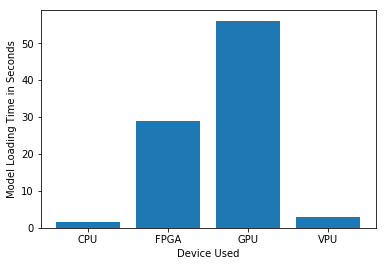

In [62]:
plt.bar(device_list, model_load_time)
plt.xlabel("Device Used")
plt.ylabel("Model Loading Time in Seconds")
plt.show()

# Step 3: Update Proposal Document

Now that you've completed your hardware testing, you should go back to the proposal document and validate or update your originally proposed hardware. Once you've updated your proposal, you can move onto the next scenario.